# Flower Classification With a Simple Flatten Network

This notebook builds a lightweight baseline classifier for the 5-flower dataset. It loads the training images from the folder structure, creates a train/validation split, trains a simple `Flatten`-based neural network, evaluates it, and generates a submission file for the test set.

# Step - 1 : Load the dataset

In [1]:
import csv
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

tf.random.set_seed(42)
np.random.seed(42)

IMG_HEIGHT = 224
IMG_WIDTH = 224
BATCH_SIZE = 32
VAL_SPLIT = 0.20
SEED = 42
AUTOTUNE = tf.data.AUTOTUNE

DATA_DIR = Path('5-flowers-image-classification')
TRAIN_DIR = DATA_DIR / 'train'
TEST_DIR = DATA_DIR / 'test'

if not TRAIN_DIR.exists() or not TEST_DIR.exists():
    raise FileNotFoundError(
        'Run this notebook from the project root so the dataset paths resolve correctly.'
    )


In [2]:
class_names = sorted([folder.name for folder in TRAIN_DIR.iterdir() if folder.is_dir()])
num_classes = len(class_names)
class_to_label = {name: idx for idx, name in enumerate(class_names)}
train_counts = {name: len(list((TRAIN_DIR / name).glob('*.jpg'))) for name in class_names}

print('Images per class:')
for name in class_names:
    print(f'  {name:<10} -> {train_counts[name]}')

print('\nLabel mapping:')
for name, idx in class_to_label.items():
    print(f'  {idx}: {name}')

print(f'\nNumber of classes: {num_classes}')
print(f'Total training images: {sum(train_counts.values())}')
print(f'Test images: {len(list(TEST_DIR.glob("*.jpg")))}')


Images per class:
  daisy      -> 691
  dandelion  -> 951
  rose       -> 694
  sunflower  -> 659
  tulip      -> 870

Label mapping:
  0: daisy
  1: dandelion
  2: rose
  3: sunflower
  4: tulip

Number of classes: 5
Total training images: 3865
Test images: 400


# Step 2 : Create TensorFlow Datasets

We build a seeded stratified train/validation split from the labeled image paths so every class is represented in `val_ds` while keeping the class proportions balanced.

In [3]:
def make_stratified_split(train_dir, class_to_label, val_split, seed):
    rng = np.random.default_rng(seed)
    train_paths = []
    train_labels = []
    val_paths = []
    val_labels = []

    for class_name in class_names:
        class_paths = np.array(sorted((train_dir / class_name).glob('*.jpg')), dtype=object)
        class_paths = rng.permutation(class_paths)

        if len(class_paths) < 2:
            raise ValueError(
                f"Need at least 2 images in class {class_name!r} for a train/validation split."
            )

        val_count = max(1, int(np.round(len(class_paths) * val_split)))
        val_count = min(len(class_paths) - 1, val_count)

        label = class_to_label[class_name]
        val_class_paths = class_paths[:val_count]
        train_class_paths = class_paths[val_count:]

        train_paths.extend(str(path) for path in train_class_paths)
        train_labels.extend([label] * len(train_class_paths))
        val_paths.extend(str(path) for path in val_class_paths)
        val_labels.extend([label] * len(val_class_paths))

    train_paths = np.array(train_paths)
    train_labels = np.array(train_labels, dtype=np.int32)
    val_paths = np.array(val_paths)
    val_labels = np.array(val_labels, dtype=np.int32)

    train_order = rng.permutation(len(train_paths))
    val_order = rng.permutation(len(val_paths))

    return (
        train_paths[train_order],
        train_labels[train_order],
        val_paths[val_order],
        val_labels[val_order],
    )


def load_labeled_image(path, label):
    image_bytes = tf.io.read_file(path)
    image = tf.io.decode_jpeg(image_bytes, channels=3)
    image = tf.image.resize(image, (IMG_HEIGHT, IMG_WIDTH))
    image = tf.cast(image, tf.float32)
    return image, label


train_paths, train_labels, val_paths, val_labels = make_stratified_split(
    TRAIN_DIR,
    class_to_label,
    VAL_SPLIT,
    SEED,
)

train_split_counts = {
    name: int(np.sum(train_labels == class_to_label[name])) for name in class_names
}
val_split_counts = {
    name: int(np.sum(val_labels == class_to_label[name])) for name in class_names
}

missing_val_classes = [name for name in class_names if val_split_counts[name] == 0]
if missing_val_classes:
    raise ValueError(f"Missing classes in val_ds: {missing_val_classes}")

print('Stratified split counts:')
for name in class_names:
    print(
        f"  {name:<10} -> train={train_split_counts[name]:>4}, val={val_split_counts[name]:>3}"
    )

print(f'\nTotal train images: {len(train_paths)}')
print(f'Total validation images: {len(val_paths)}')

train_ds = tf.data.Dataset.from_tensor_slices((train_paths, train_labels))
train_ds = train_ds.map(load_labeled_image, num_parallel_calls=AUTOTUNE)
train_ds = train_ds.shuffle(len(train_paths), seed=SEED).batch(BATCH_SIZE).prefetch(AUTOTUNE)

val_ds = tf.data.Dataset.from_tensor_slices((val_paths, val_labels))
val_ds = val_ds.map(load_labeled_image, num_parallel_calls=AUTOTUNE)
val_ds = val_ds.batch(BATCH_SIZE).prefetch(AUTOTUNE)


Stratified split counts:
  daisy      -> train= 553, val=138
  dandelion  -> train= 761, val=190
  rose       -> train= 555, val=139
  sunflower  -> train= 527, val=132
  tulip      -> train= 696, val=174

Total train images: 3092
Total validation images: 773


In [4]:
for image_batch, label_batch in train_ds.take(1):
    print('Image batch shape:', image_batch.shape)
    print('Label batch shape:', label_batch.shape)
    print('First 10 labels:', label_batch[:10].numpy())


Image batch shape: (32, 224, 224, 3)
Label batch shape: (32,)
First 10 labels: [3 4 3 4 3 4 4 1 3 3]


# Step 3 : Visualize the Images

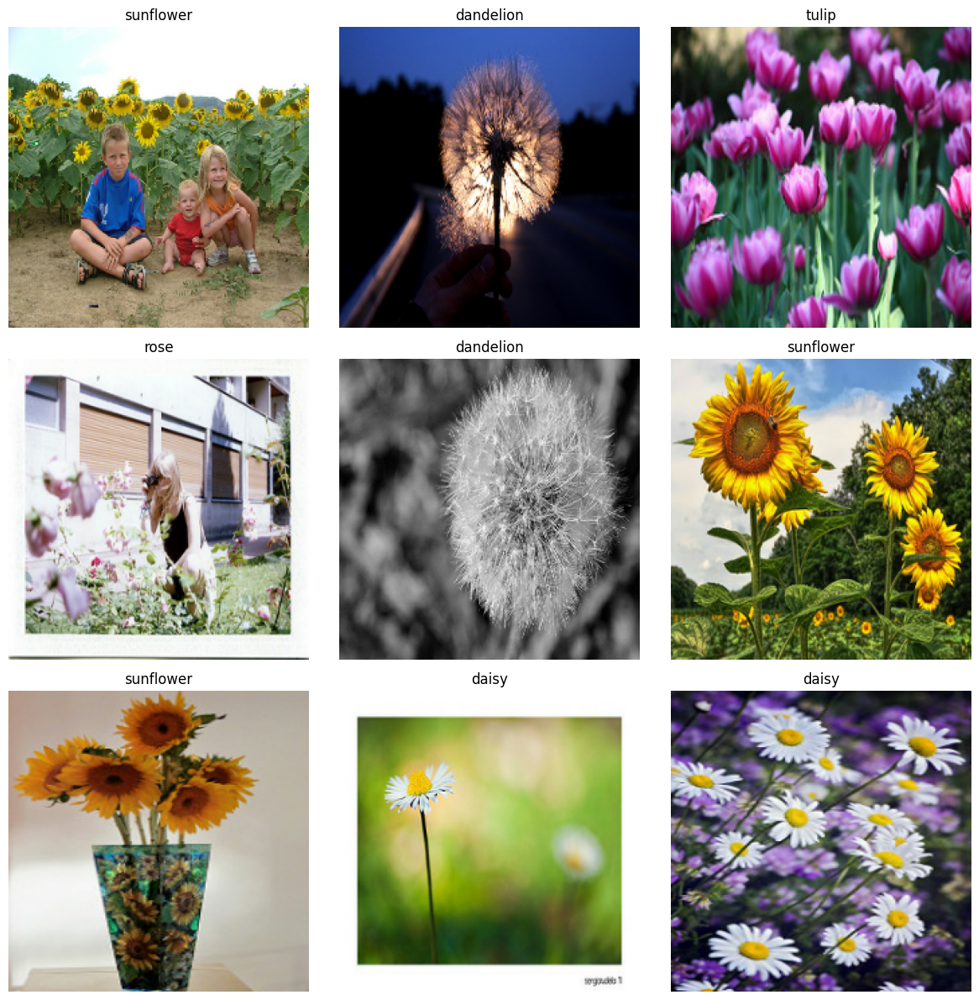

In [5]:
plt.figure(figsize=(12, 12))
for image_batch, label_batch in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(image_batch[i].numpy().astype('uint8'))
        plt.title(class_names[int(label_batch[i].numpy())])
        plt.axis('off')
plt.tight_layout()


# Step - 4: Build a Simple Flatten Model

This is a baseline fully connected classifier: rescale the pixels, flatten the image, and learn a softmax output over the five flower classes.

In [6]:
model = tf.keras.Sequential(
    [
        tf.keras.layers.Input(shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        tf.keras.layers.Rescaling(1.0 / 255.0),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(num_classes, activation='softmax'),
    ],
    name='simple_flatten_classifier',
)

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.01),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy'],
)

model.summary()

Model: "simple_flatten_classifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 150528)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 5)              │       752,645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 752,645 (2.87 MB)

 Trainable params: 752,645 (2.87 MB)

 Non-trainable params: 0 (0.00 B)

In [7]:
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=15,
)


Epoch 1/15
97/97 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.3321 - loss: 143.0384 - val_accuracy: 0.3609 - val_loss: 72.8496
Epoch 2/15
97/97 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.3907 - loss: 80.3748 - val_accuracy: 0.4179 - val_loss: 61.6777
Epoch 3/15
97/97 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.4440 - loss: 60.2056 - val_accuracy: 0.4049 - val_loss: 63.8012
Epoch 4/15
97/97 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.4699 - loss: 62.4937 - val_accuracy: 0.3596 - val_loss: 79.0421
Epoch 5/15
97/97 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.4948 - loss: 60.7878 - val_accuracy: 0.3777 - val_loss: 56.2043
Epoch 6/15
97/97 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.5320 - loss: 49.1519 - val_accuracy: 0.4114 - val_loss: 93.4449
Epoch 7/15
97/97 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.5323 - loss: 51.0499 - val_accuracy: 0.4127 - val_loss: 69.5275
Epoch 8/15
97/97 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.5724 - loss: 39.1207 - val_accu

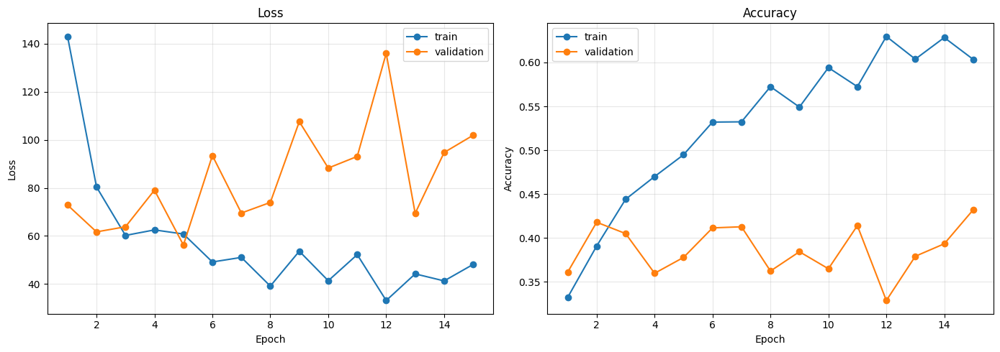

In [8]:
history_dict = history.history
epochs_ran = range(1, len(history_dict['loss']) + 1)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(epochs_ran, history_dict['loss'], marker='o', label='train')
axes[0].plot(epochs_ran, history_dict['val_loss'], marker='o', label='validation')
axes[0].set_title('Loss')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].grid(alpha=0.3)
axes[0].legend()

axes[1].plot(epochs_ran, history_dict['accuracy'], marker='o', label='train')
axes[1].plot(epochs_ran, history_dict['val_accuracy'], marker='o', label='validation')
axes[1].set_title('Accuracy')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Accuracy')
axes[1].grid(alpha=0.3)
axes[1].legend()

plt.tight_layout()


Validation loss: 101.8875
Validation accuracy: 0.4321

Per-class validation accuracy:
  daisy      ->   3/138 = 0.0217
  dandelion  -> 140/190 = 0.7368
  rose       ->  90/139 = 0.6475
  sunflower  ->  70/132 = 0.5303
  tulip      ->  31/174 = 0.1782


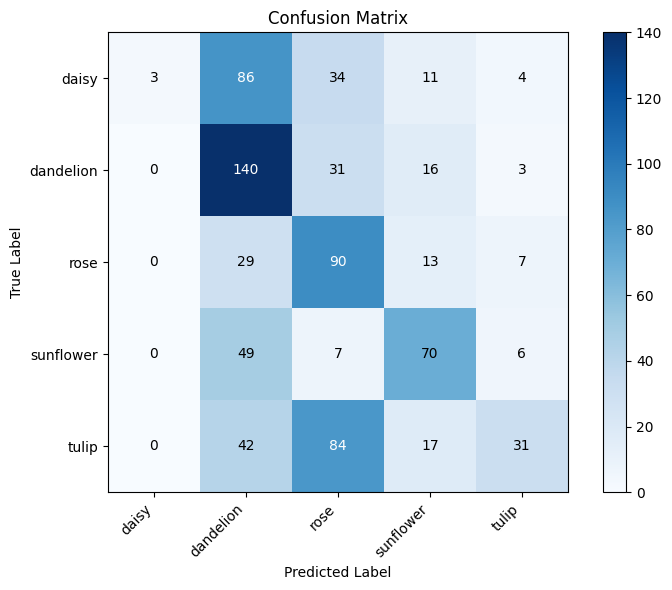

In [9]:
val_loss, val_accuracy = model.evaluate(val_ds, verbose=0)
print(f"Validation loss: {val_loss:.4f}")
print(f"Validation accuracy: {val_accuracy:.4f}")

y_true = np.concatenate([labels.numpy() for _, labels in val_ds], axis=0)
y_pred = np.argmax(model.predict(val_ds, verbose=0), axis=1)

confusion = tf.math.confusion_matrix(
    y_true,
    y_pred,
    num_classes=num_classes
).numpy()

per_class_totals = confusion.sum(axis=1)
per_class_correct = np.diag(confusion)
per_class_accuracy = np.divide(
    per_class_correct,
    per_class_totals,
    out=np.zeros(num_classes, dtype=np.float64),
    where=per_class_totals > 0,
)

print("\nPer-class validation accuracy:")
for class_idx, class_name in enumerate(class_names):
    print(
        f"  {class_name:<10} -> {per_class_correct[class_idx]:>3}/{per_class_totals[class_idx]:<3}"
        f" = {per_class_accuracy[class_idx]:.4f}"
    )

plt.figure(figsize=(8, 6))
plt.imshow(confusion, interpolation="nearest", cmap="Blues")
plt.title("Confusion Matrix")
plt.colorbar()

tick_marks = np.arange(num_classes)
plt.xticks(tick_marks, class_names, rotation=45, ha="right")
plt.yticks(tick_marks, class_names)

for i in range(confusion.shape[0]):
    for j in range(confusion.shape[1]):
        plt.text(
            j,
            i,
            str(confusion[i, j]),
            ha="center",
            va="center",
            color="white" if confusion[i, j] > confusion.max() / 2 else "black"
        )

plt.ylabel("True Label")
plt.xlabel("Predicted Label")
plt.tight_layout()
plt.show()


## Predict on the Test Set

The submission file still uses integer labels, but the preview below shows class names. The test set is unlabeled, so wrong predictions can only be highlighted on the validation preview that follows.

In [10]:
test_paths = sorted(TEST_DIR.glob('*.jpg'), key=lambda path: int(path.stem))
test_ids = [int(path.stem) for path in test_paths]

def load_test_image(path):
    image_bytes = tf.io.read_file(path)
    image = tf.io.decode_jpeg(image_bytes, channels=3)
    image = tf.image.resize(image, (IMG_HEIGHT, IMG_WIDTH))
    return tf.cast(image, tf.float32)

test_ds = tf.data.Dataset.from_tensor_slices([str(path) for path in test_paths])
test_ds = test_ds.map(load_test_image, num_parallel_calls=AUTOTUNE).batch(BATCH_SIZE).prefetch(AUTOTUNE)

test_probabilities = model.predict(test_ds, verbose=0)
test_predictions = np.argmax(test_probabilities, axis=1)

submission_path = DATA_DIR / 'submission_simple_flatten.csv'
with submission_path.open('w', newline='') as csv_file:
    writer = csv.writer(csv_file)
    writer.writerow(['id', 'label'])
    writer.writerows(zip(test_ids, test_predictions))

test_confidences = np.max(test_probabilities, axis=1)

print('Preview of predictions:')
for image_id, predicted_label, confidence in list(zip(test_ids, test_predictions, test_confidences))[:5]:
    predicted_name = class_names[int(predicted_label)]
    print(f'  id={image_id:>3} -> predicted={predicted_name} ({confidence:.2f})')

print(f'Saved submission to: {submission_path.resolve()}')
print()
print('Test set note: correct and misprediction counts cannot be computed on test_ds because test_ds has no ground-truth labels.')
print('Using val_ds for evaluation instead.')

val_probabilities_batches = []
val_labels = []

for images, labels in val_ds:
    val_probabilities_batches.append(model.predict(images, verbose=0))
    val_labels.append(labels.numpy())

val_probabilities = np.concatenate(val_probabilities_batches, axis=0)
val_predictions = np.argmax(val_probabilities, axis=1)
val_confidences = np.max(val_probabilities, axis=1)
y_true = np.concatenate(val_labels, axis=0)

correct = np.sum(val_predictions == y_true)
incorrect = np.sum(val_predictions != y_true)
total = len(y_true)
val_accuracy = correct / total

val_confusion = tf.math.confusion_matrix(y_true, val_predictions, num_classes=num_classes).numpy()
val_per_class_totals = val_confusion.sum(axis=1)
val_per_class_correct = np.diag(val_confusion)
val_per_class_accuracy = np.divide(
    val_per_class_correct,
    val_per_class_totals,
    out=np.zeros(num_classes, dtype=np.float64),
    where=val_per_class_totals > 0,
)

print()
print('Validation results:')
print(f'Total validation images : {total}')
print(f'Correct predictions     : {correct}')
print(f'Mispredictions          : {incorrect}')
print(f'Validation accuracy     : {val_accuracy:.4f}')

print()
print('Per-class validation accuracy:')
for class_idx, class_name in enumerate(class_names):
    print(
        f'  {class_name:<10} -> {val_per_class_correct[class_idx]:>3}/{val_per_class_totals[class_idx]:<3}'
        f' = {val_per_class_accuracy[class_idx]:.4f}'
    )

misclassified_indices = np.where(val_predictions != y_true)[0]

print()
print('First few misclassified validation samples:')
if len(misclassified_indices) == 0:
    print('  None')
else:
    for idx in misclassified_indices[:5]:
        true_idx = int(y_true[idx])
        predicted_idx = int(val_predictions[idx])
        print(
            f'  sample_index={idx}, '
            f'true={class_names[true_idx]}, '
            f'predicted={class_names[predicted_idx]}, '
            f'confidence={val_confidences[idx]:.2f}'
        )


Preview of predictions:
  id=  1 -> predicted=sunflower (1.00)
  id=  2 -> predicted=rose (1.00)
  id=  3 -> predicted=rose (0.51)
  id=  4 -> predicted=rose (1.00)
  id=  5 -> predicted=rose (1.00)
Saved submission to: F:\ML\CV_Project2_Codebase\5-flowers-image-classification\submission_simple_flatten.csv

Test set note: correct and misprediction counts cannot be computed on test_ds because test_ds has no ground-truth labels.
Using val_ds for evaluation instead.

Validation results:
Total validation images : 773
Correct predictions     : 334
Mispredictions          : 439
Validation accuracy     : 0.4321

Per-class validation accuracy:
  daisy      ->   3/138 = 0.0217
  dandelion  -> 140/190 = 0.7368
  rose       ->  90/139 = 0.6475
  sunflower  ->  70/132 = 0.5303
  tulip      ->  31/174 = 0.1782

First few misclassified validation samples:
  sample_index=0, true=tulip, predicted=rose, confidence=1.00
  sample_index=2, true=tulip, predicted=dandelion, confidence=1.00
  sample_index=4,

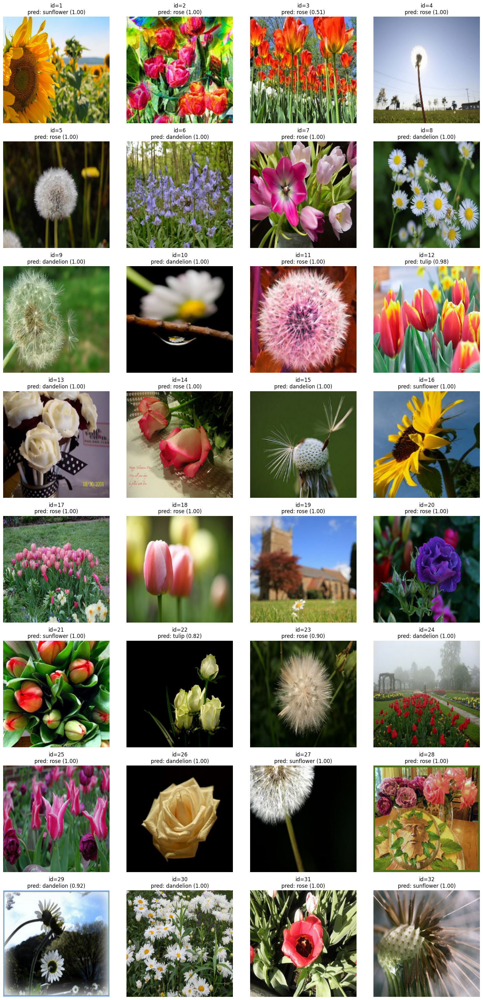

In [11]:
first_test_images = next(iter(test_ds.take(1)))
first_test_probabilities = model.predict(first_test_images, verbose=0)
first_test_predictions = np.argmax(first_test_probabilities, axis=1)
first_test_confidences = np.max(first_test_probabilities, axis=1)
first_batch_ids = test_ids[: len(first_test_predictions)]

num_images = len(first_test_predictions)
cols = min(4, num_images)
rows = int(np.ceil(num_images / cols))

plt.figure(figsize=(4 * cols, 4 * rows))
for i in range(num_images):
    ax = plt.subplot(rows, cols, i + 1)
    display_image = np.clip(first_test_images[i].numpy(), 0, 255).astype('uint8')
    plt.imshow(display_image)
    predicted_idx = int(first_test_predictions[i])
    confidence = first_test_confidences[i]
    plt.title(f"id={first_batch_ids[i]}\npred: {class_names[predicted_idx]} ({confidence:.2f})")
    plt.axis('off')

plt.tight_layout()
plt.show()

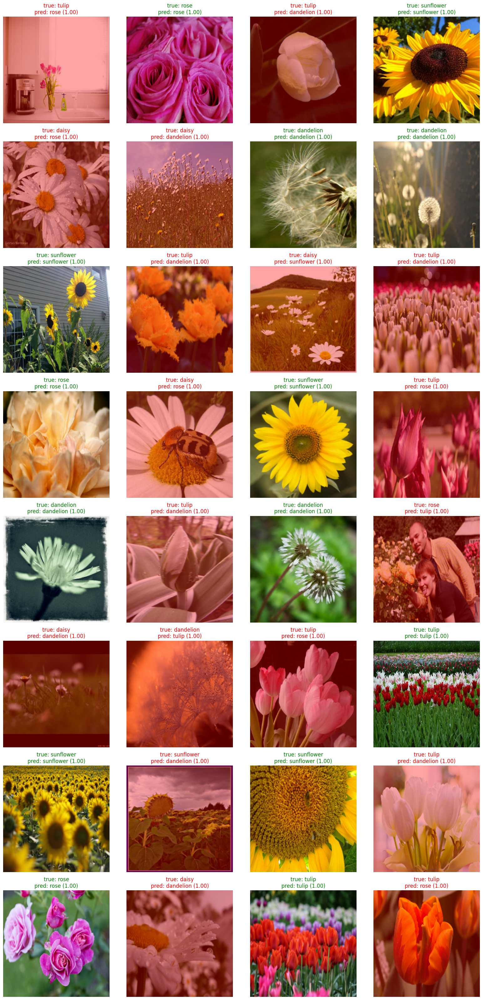

In [12]:
first_val_images, first_val_labels = next(iter(val_ds.take(1)))
first_val_probabilities = model.predict(first_val_images, verbose=0)
first_val_predictions = np.argmax(first_val_probabilities, axis=1)
first_val_confidences = np.max(first_val_probabilities, axis=1)

num_images = len(first_val_predictions)
cols = min(4, num_images)
rows = int(np.ceil(num_images / cols))

plt.figure(figsize=(4 * cols, 4 * rows))
for i in range(num_images):
    ax = plt.subplot(rows, cols, i + 1)
    display_image = np.clip(first_val_images[i].numpy(), 0, 255).astype(np.float32)
    true_idx = int(first_val_labels[i].numpy())
    predicted_idx = int(first_val_predictions[i])
    confidence = first_val_confidences[i]
    is_correct = predicted_idx == true_idx

    if not is_correct:
        red_overlay = np.zeros_like(display_image)
        red_overlay[..., 0] = 255.0
        display_image = 0.65 * display_image + 0.35 * red_overlay

    plt.imshow(display_image.astype('uint8'))
    title_color = 'green' if is_correct else 'red'
    true_name = class_names[true_idx]
    predicted_name = class_names[predicted_idx]
    plt.title(
        f"true: {true_name}\npred: {predicted_name} ({confidence:.2f})",
        color=title_color,
    )
    plt.axis('off')

plt.tight_layout()
plt.show()

In [13]:
model_path = Path('simple_flatten_flower_classifier.keras')
model.save(model_path)
print(f'Saved model to: {model_path.resolve()}')

Saved model to: F:\ML\CV_Project2_Codebase\simple_flatten_flower_classifier.keras
